## YOLOv5 model for traffic light detection
### THD project 

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
!pip install -U -r yolov5/requirements.txt  # install dependencies

Cloning into 'yolov5'...
remote: Enumerating objects: 15705, done.
remote: Counting objects: 100% (33/33), done.
remote: Compressing objects: 100% (29/29), done.
remote: Total 15705 (delta 9), reused 19 (delta 4), pack-reused 15672
Receiving objects: 100% (15705/15705), 14.44 MiB | 17.31 MiB/s, done.
Resolving deltas: 100% (10755/10755), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 87.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 112.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.6/62.6 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 589.4/589.4 kB 44.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 81.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 54.9 MB/s eta 

In [ ]:
import torch
from IPython.display import Image  # for displaying images
# from utils.google_utils import gdrive_download  # for downloading models/datasets

print('torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

torch 2.0.1+cu118 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15101MB, multi_processor_count=40)


Installing Roboflow library to download cinTA_v2 dataset with labeled traffic lights

In [ ]:
!pip install roboflow

%cd /content/yolov5

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="api_key")
project = rf.workspace("wawan-pradana").project("cinta_v2")
dataset = project.version(1).download("yolov5")


loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to cinTA_v2-1 in yolov5pytorch:: 100%|██████████| 4806/4806 [00:01<00:00, 3544.16it/s]


In [ ]:
# alternative variant to download dataset from google drive

# import zipfile
# from google.colab import drive

# drive.mount('/content/drive/')

# zip_ref = zipfile.ZipFile("/content/drive/MyDrive/cinTA_traffic_lights_ds.zip", 'r')
# zip_ref.extractall("/content/traffic_lights")
# zip_ref.close()

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
%cat {dataset.location}/data.yaml

cat: /content/cinTA_v2-1/data.yaml: No such file or directory


Defining number of classes, here we have only 3 of them: green, yellow, red

In [ ]:
# define number of classes based on YAML
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

Structure of YOLOv5 small

In [ ]:
%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, AGPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

Copy of original structure yolov5 to custom_yolov5 file for futher manipulations


In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml
# Parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

usage: detect.py <br /> [-h] [--weights WEIGHTS [WEIGHTS ...]] [--source SOURCE]
                <br /> [--data DATA] [--imgsz IMGSZ [IMGSZ ...]]
               <br />  [--conf-thres CONF_THRES] [--iou-thres IOU_THRES]
               <br />  [--max-det MAX_DET] [--device DEVICE] [--view-img]
               <br />  [--save-txt] [--save-conf] [--save-crop] [--nosave]
                <br /> [--classes CLASSES [CLASSES ...]] [--agnostic-nms]
                <br /> [--augment] [--visualize] [--update] [--project PROJECT]
               <br />  [--name NAME] [--exist-ok] [--line-thickness LINE_THICKNESS]
               <br />  [--hide-labels] [--hide-conf] [--half] [--dnn]
              <br />   [--vid-stride VID_STRIDE]


train.py arguments

<em>
 parser.add_argument('--model', type=str, default='yolov5s-cls.pt', help='initial weights path')
  <br /> parser.add_argument('--data', type=str, default='imagenette160', help='cifar10, cifar100, mnist, imagenet, ...')
   <br /> parser.add_argument('--epochs', type=int, default=10, help='total training epochs')
   <br /> parser.add_argument('--batch-size', type=int, default=64, help='total batch size for all GPUs')
   <br /> parser.add_argument('--imgsz', '--img', '--img-size', type=int, default=224, help='train, val image size (pixels)')
  <br />  parser.add_argument('--nosave', action='store_true', help='only save final checkpoint')
  <br />  parser.add_argument('--cache', type=str, nargs='?', const='ram', help='--cache images in "ram" (default) or "disk"')
  <br />  parser.add_argument('--device', default='', help='cuda device, i.e. 0 or 0,1,2,3 or cpu')
  <br />  parser.add_argument('--workers', type=int, default=8, help='max dataloader workers (per RANK in DDP mode)')
  <br />  parser.add_argument('--project', default=ROOT / 'runs/train-cls', help='save to project/name')
  <br />  parser.add_argument('--name', default='exp', help='save to project/name')
  <br />  parser.add_argument('--exist-ok', action='store_true', help='existing project/name ok, do not increment')
  <br />  parser.add_argument('--pretrained', nargs='?', const=True, default=True, help='start from i.e. --pretrained False')
  <br />  parser.add_argument('--optimizer', choices=['SGD', 'Adam', 'AdamW', 'RMSProp'], default='Adam', help='optimizer')
  <br />  parser.add_argument('--lr0', type=float, default=0.001, help='initial learning rate')
  <br />  parser.add_argument('--decay', type=float, default=5e-5, help='weight decay')
  <br />  parser.add_argument('--label-smoothing', type=float, default=0.1, help='Label smoothing epsilon')
  <br />  parser.add_argument('--cutoff', type=int, default=None, help='Model layer cutoff index for Classify() head')
  <br />  parser.add_argument('--dropout', type=float, default=None, help='Dropout (fraction)')
  <br />  parser.add_argument('--verbose', action='store_true', help='Verbose mode')
  <br />  parser.add_argument('--seed', type=int, default=0, help='Global training seed')
  <br />  parser.add_argument('--local_rank', type=int, default=-1, help='Automatic DDP Multi-GPU argument, do not modify')
  </em>


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

Training model for 100 epoches
</br> Can specify particular file with weights




In [ ]:
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 100 --data /content/yolov5/cinTA_v2-1/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

Visualization

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
!pip install utils

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Some common metrics

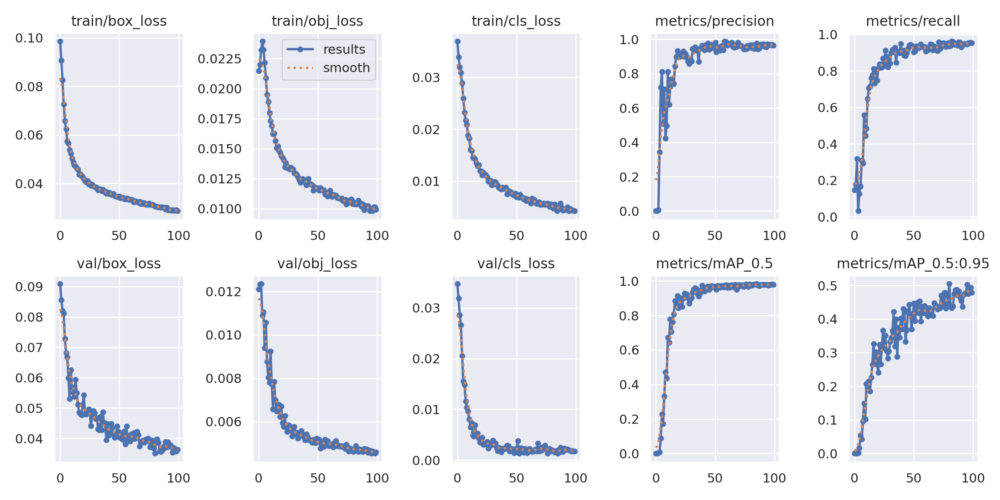

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5s_results4/results.png', width=1000)  # view results.png

GROUND TRUTH TRAINING DATA:


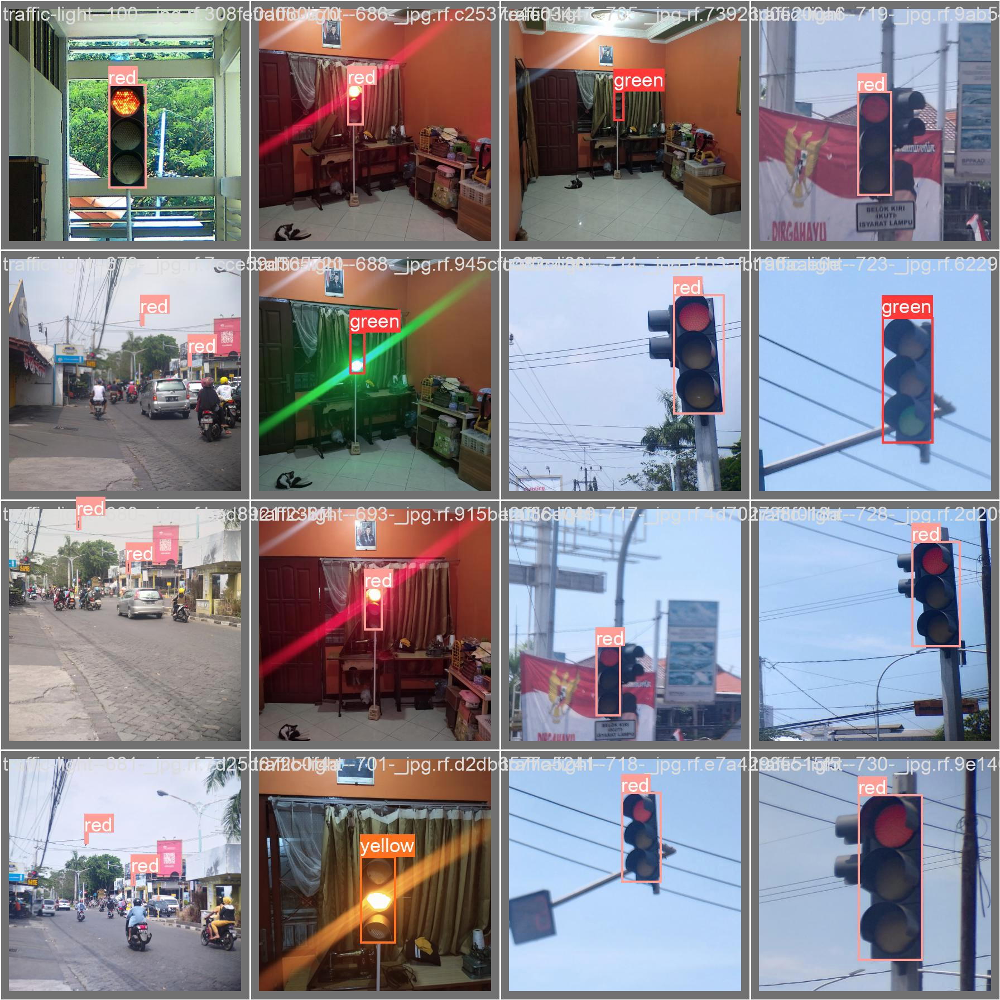

In [ ]:
print("GROUND TRUTH VAL DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results4/val_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


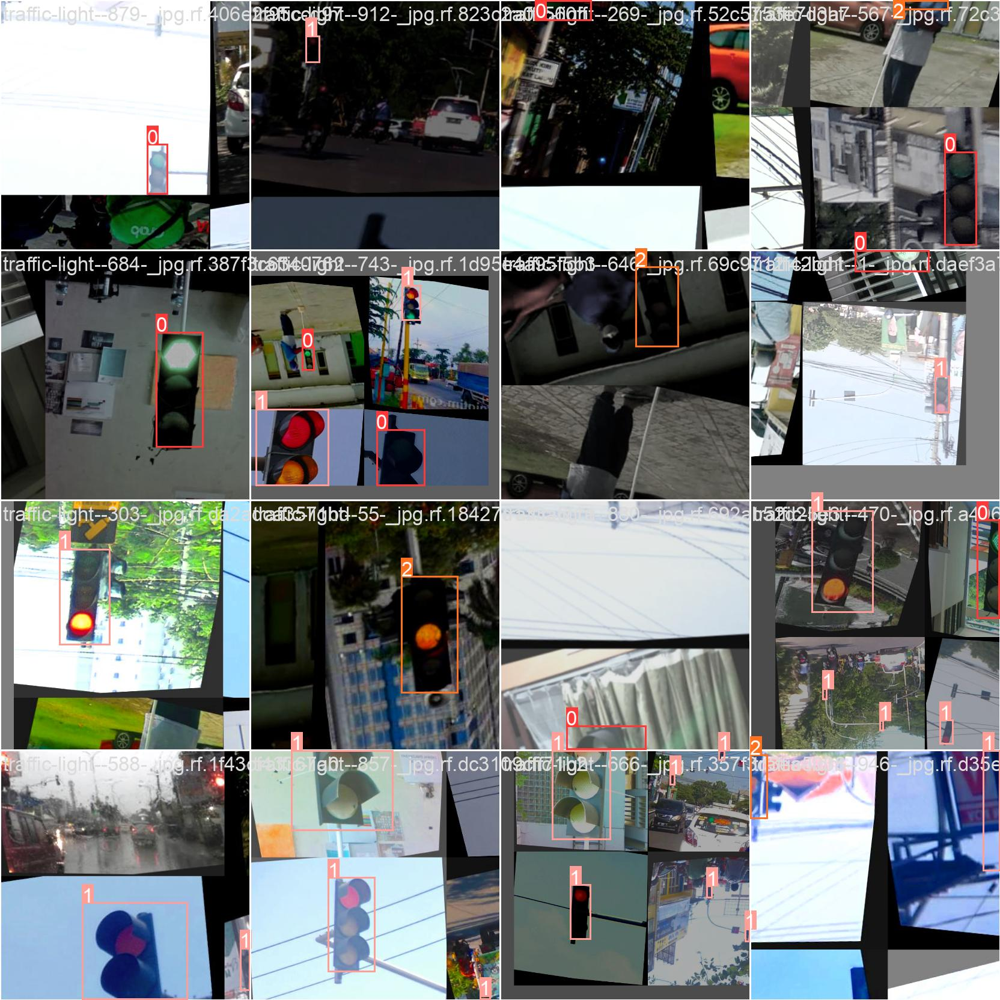

In [ ]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results4/train_batch0.jpg', width=900)

In [ ]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [ ]:
%ls runs/train/yolov5s_results/weights

Detecting classes with best weights model



In [ ]:
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results4/weights/best.pt --img 416 --conf 0.4 --source ./cinTA_v2-1/test/images

/content/yolov5
detect: weights=['runs/train/yolov5s_results4/weights/best.pt'], source=./cinTA_v2-1/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/100 /content/yolov5/cinTA_v2-1/test/images/traffic-light--119-_jpg.rf.65198e341a15fa6a0ba8be43a289c5f2.jpg: 416x416 1 yellow, 7.4ms
image 2/100 /content/yolov5/cinTA_v2-1/test/images/traffic-light--122-_jpg.rf.63cb9e27085f500f6936833c196db2b8.jpg: 416x416 1 yellow, 8.7ms
image 3/100 /content/yol

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

Saving weights

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%cp /content/yolov5/runs/train/yolov5s_results4/weights/best.pt /content/gdrive/MyDrive